In [1]:
"""
Copyright (c) 2019-present NAVER Corp.
MIT License
"""

# !pip install opencv  # ! used for command line commands in notebooks

'\nCopyright (c) 2019-present NAVER Corp.\nMIT License\n'

In [2]:
import craft_utils
import imgproc
import file_utils


In [3]:
1# -*- coding: utf-8 -*-
import sys
import os
import time
import argparse

In [4]:
import torch
import torch.nn as nn
import torch.backends.cudnn as cudnn
from torch.autograd import Variable

In [5]:
from PIL import Image

In [6]:



import json
import zipfile

In [7]:

import cv2
from skimage import io
import numpy as np

In [8]:
print(cudnn.is_available())
print (torch.cuda.is_available())

True
True


In [9]:
from craft import CRAFT
#!ls


e:\Study\Environments\testlab\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [10]:
from collections import OrderedDict
def copyStateDict(state_dict):
    if list(state_dict.keys())[0].startswith("module"):
        start_idx = 1
    else:
        start_idx = 0
    new_state_dict = OrderedDict()
    for k, v in state_dict.items():
        name = ".".join(k.split(".")[start_idx:])
        new_state_dict[name] = v
    return new_state_dict

In [11]:
def str2bool(v):
    return v.lower() in ("yes", "y", "true", "t", "1")

In [12]:
"""
parser = argparse.ArgumentParser(description='CRAFT Text Detection')
parser.add_argument('--trained_model', default='weights/craft_mlt_25k.pth', type=str, help='pretrained model')
parser.add_argument('--text_threshold', default=0.7, type=float, help='text confidence threshold') #0.7
parser.add_argument('--low_text', default=0.4, type=float, help='text low-bound score')
parser.add_argument('--link_threshold', default=0.2, type=float, help='link confidence threshold') #0.2
parser.add_argument('--cuda', default=True, type=str2bool, help='Use cuda for inference')
parser.add_argument('--canvas_size', default=1280, type=int, help='image size for inference')
parser.add_argument('--mag_ratio', default=2.0, type=float, help='image magnification ratio') # 1.5
parser.add_argument('--poly', default=False, action='store_true', help='enable polygon type')
parser.add_argument('--show_time', default=False, action='store_true', help='show processing time')
parser.add_argument('--test_folder', default='Data', type=str, help='folder path to input images')
parser.add_argument('--refine', default=False, action='store_true', help='enable link refiner')
parser.add_argument('--refiner_model', default='weights/craft_refiner_CTW1500.pth', type=str, help='pretrained refiner model')
"""

"\nparser = argparse.ArgumentParser(description='CRAFT Text Detection')\nparser.add_argument('--trained_model', default='weights/craft_mlt_25k.pth', type=str, help='pretrained model')\nparser.add_argument('--text_threshold', default=0.7, type=float, help='text confidence threshold') #0.7\nparser.add_argument('--low_text', default=0.4, type=float, help='text low-bound score')\nparser.add_argument('--link_threshold', default=0.2, type=float, help='link confidence threshold') #0.2\nparser.add_argument('--cuda', default=True, type=str2bool, help='Use cuda for inference')\nparser.add_argument('--canvas_size', default=1280, type=int, help='image size for inference')\nparser.add_argument('--mag_ratio', default=2.0, type=float, help='image magnification ratio') # 1.5\nparser.add_argument('--poly', default=False, action='store_true', help='enable polygon type')\nparser.add_argument('--show_time', default=False, action='store_true', help='show processing time')\nparser.add_argument('--test_folde

In [13]:
parser = argparse.ArgumentParser(description='CRAFT Text Detection')
parser.add_argument('--trained_model', default='weights/craft_mlt_25k.pth', type=str, help='pretrained model')
parser.add_argument('--text_threshold', default=0.01, type=float, help='text confidence threshold') #0.7 0.01
parser.add_argument('--low_text', default=0.4, type=float, help='text low-bound score') #0.4
parser.add_argument('--link_threshold', default=0.05, type=float, help='link confidence threshold') #0.2  0.05
parser.add_argument('--cuda', default=True, type=str2bool, help='Use cuda for inference')
parser.add_argument('--canvas_size', default=1920, type=int, help='image size for inference')
parser.add_argument('--mag_ratio', default=1.0, type=float, help='image magnification ratio') # 1.5
parser.add_argument('--poly', default=True, action='store_true', help='enable polygon type')
parser.add_argument('--show_time', default=False, action='store_true', help='show processing time')
parser.add_argument('--test_folder', default='Data2', type=str, help='folder path to input images')
parser.add_argument('--refine', default=True, action='store_true', help='enable link refiner')
parser.add_argument('--refiner_model', default='weights/craft_refiner_CTW1500.pth', type=str, help='pretrained refiner model')

_StoreAction(option_strings=['--refiner_model'], dest='refiner_model', nargs=None, const=None, default='weights/craft_refiner_CTW1500.pth', type=<class 'str'>, choices=None, required=False, help='pretrained refiner model', metavar=None)

In [14]:
args, unknown = parser.parse_known_args()

In [15]:
""" For test images in a folder """
image_list, _, _ = file_utils.get_files(args.test_folder)
print(args.test_folder)

Data2


In [16]:
result_folder = './result/'
if not os.path.isdir(result_folder):
    os.mkdir(result_folder)

In [17]:
def test_net(net, image, text_threshold, link_threshold, low_text, cuda, poly, refine_net=None):
    t0 = time.time()

    # resize
    img_resized, target_ratio, size_heatmap = imgproc.resize_aspect_ratio(image, args.canvas_size, interpolation=cv2.INTER_LINEAR, mag_ratio=args.mag_ratio)
    
    ratio_h = ratio_w = 1 / target_ratio

    # preprocessing
    x = imgproc.normalizeMeanVariance(img_resized)
    x = torch.from_numpy(x).permute(2, 0, 1)    # [h, w, c] to [c, h, w]
    x = Variable(x.unsqueeze(0))                # [c, h, w] to [b, c, h, w]
    if cuda:
        x = x.cuda()

    # forward pass
    with torch.no_grad():
        y, feature = net(x)

    # make score and link map
    score_text = y[0,:,:,0].cpu().data.numpy()
    score_link = y[0,:,:,1].cpu().data.numpy()

    # refine link
    if refine_net is not None:
        with torch.no_grad():
            y_refiner = refine_net(y, feature)
        score_link = y_refiner[0,:,:,0].cpu().data.numpy()

    t0 = time.time() - t0
    t1 = time.time()

    # Post-processing
    boxes, polys = craft_utils.getDetBoxes(score_text, score_link, text_threshold, link_threshold, low_text, poly)

    # coordinate adjustment
    boxes = craft_utils.adjustResultCoordinates(boxes, ratio_w, ratio_h)
    polys = craft_utils.adjustResultCoordinates(polys, ratio_w, ratio_h)
    
    for k in range(len(polys)):
        if polys[k] is None:
            polys[k] = boxes[k] 
    
    t1 = time.time() - t1

    # render results (optional)
    render_img = score_text.copy()
    render_img = np.hstack((render_img, score_link))
    ret_score_text = imgproc.cvt2HeatmapImg(render_img)

    if args.show_time : print("\ninfer/postproc time : {:.3f}/{:.3f}".format(t0, t1))

    return boxes, polys, ret_score_text

In [18]:

if __name__ == '__main__':
    # load net
    net = CRAFT()     # initialize

    print('Loading weights from checkpoint (' + args.trained_model + ')')
    if args.cuda:
        net.load_state_dict(copyStateDict(torch.load(args.trained_model)))
    else:
        net.load_state_dict(copyStateDict(torch.load(args.trained_model, map_location='cpu')))

    if args.cuda:
        net = net.cuda()
        net = torch.nn.DataParallel(net)
        cudnn.benchmark = False

    net.eval()

    # LinkRefiner
    refine_net = None
    if args.refine:
        from refinenet import RefineNet
        refine_net = RefineNet()
        print('Loading weights of refiner from checkpoint (' + args.refiner_model + ')')
        if args.cuda:
            refine_net.load_state_dict(copyStateDict(torch.load(args.refiner_model)))
            refine_net = refine_net.cuda()
            refine_net = torch.nn.DataParallel(refine_net)
        else:
            refine_net.load_state_dict(copyStateDict(torch.load(args.refiner_model, map_location='cpu')))

        refine_net.eval()
        args.poly = True

    t = time.time()

    # load data
    for k, image_path in enumerate(image_list):
        print("Test image {:d}/{:d}: {:s}".format(k+1, len(image_list), image_path), end='\r')
        image = imgproc.loadImage(image_path)

        bboxes, polys, score_text = test_net(net, image, args.text_threshold, args.link_threshold, args.low_text, args.cuda, args.poly, refine_net)

        # save score text
        filename, file_ext = os.path.splitext(os.path.basename(image_path))
        mask_file = result_folder + "/res_" + filename + '_mask.jpg'
        cv2.imwrite(mask_file, score_text)

        file_utils.saveResult(image_path, image[:,:,::-1], polys, dirname=result_folder)

    print("elapsed time : {}s".format(time.time() - t))

e:\Study\Environments\testlab\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
e:\Study\Environments\testlab\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Loading weights from checkpoint (weights/craft_mlt_25k.pth)
Loading weights of refiner from checkpoint (weights/craft_refiner_CTW1500.pth)
elapsed time : 51.574949502944946s0413692456982217.jpg


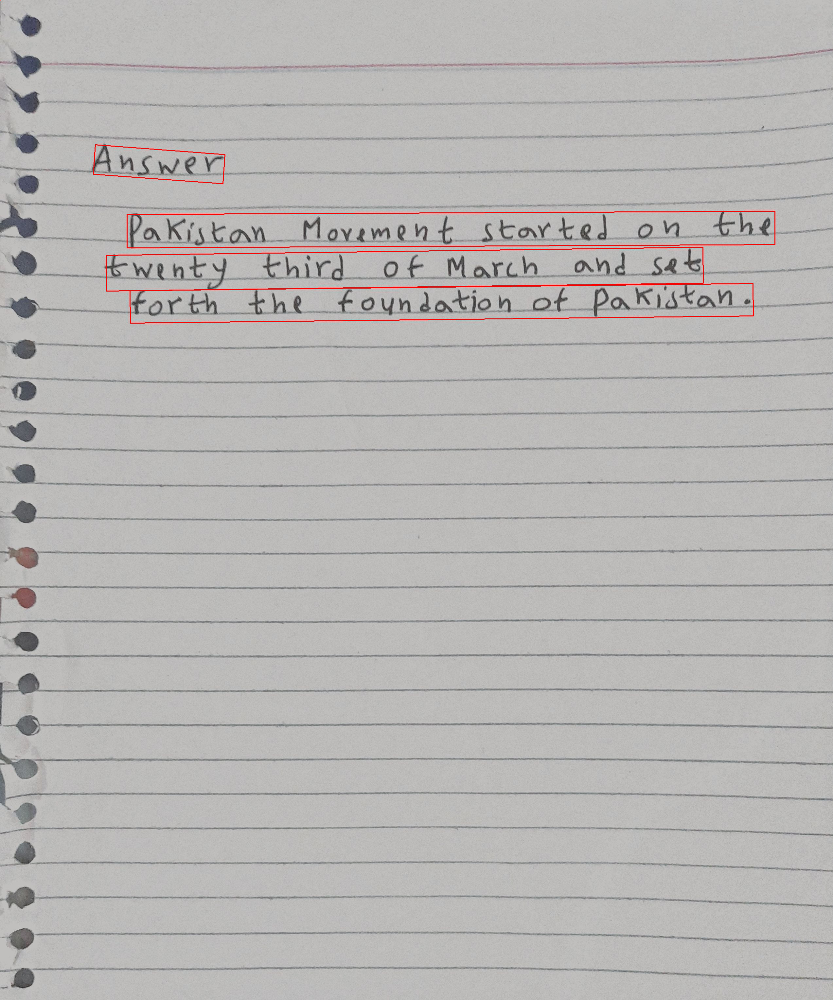

In [27]:
image_path = "result/res_530310803821930.jpg"
image = Image.open(image_path)
display(image)

In [28]:
def polygon_to_rectangle(polygon):
    # Extract x and y coordinates
    x_coords = polygon[::2]
    y_coords = polygon[1::2]

    # Find minimum and maximum x and y coordinates
    min_x = min(x_coords)
    max_x = max(x_coords)
    min_y = min(y_coords)
    max_y = max(y_coords)

    # Construct the rectangle with 8 coordinates
    rectangle = [
        min_x, min_y,  # Top-left corner
        max_x, min_y,  # Top-right corner
        max_x, max_y,  # Bottom-right corner
        min_x, max_y   # Bottom-left corner
    ]

    return rectangle

def read_bounding_boxes_from_file(file_path):
    with open(file_path, 'r') as file:
        lines = file.readlines()
        lines_cleaned = [line.strip() for line in lines if line.strip()]
        boxes = []
        for line in lines_cleaned:
            # Split the line by commas and remove any leading/trailing whitespace
            values = [value.strip() for value in line.strip().split(',') if value.strip()]
            
            # Convert non-empty values to integers
            box = list(map(int, values))
            if(len(box)>8):
                box=polygon_to_rectangle(box)
            if box:  # Only append non-empty boxes
                boxes.append(box)
            
    return boxes

# Read word-level bounding boxes from a text file
word_boxes = read_bounding_boxes_from_file('result/res_530310803821930.txt')




def increase_boxes_size(bounding_boxes, increase_value):
    increased_boxes = []
    for box in bounding_boxes:
        # Extract coordinates
        x1, y1, x2, y2, x3, y3, x4, y4 = box
        
        # Calculate original height
        height = max(y3, y4) - min(y1, y2)
        
        # Increase height by the specified value
        increased_height = height + increase_value
        
        # Adjust the y-coordinates of the bottom vertices (y3, y4) for height increase
        y3 += increase_value
        y4 += increase_value
        
        # Append the modified bounding box to the list
        increased_boxes.append((x1, y1, x2, y2, x3, y3, x4, y4))
    return increased_boxes



def increase_bbox_width(boxes):
    increased_boxes = []
    for box in boxes:
        x1, y1, x2, y2, x3, y3, x4, y4 = box
        # Increase width by adding the increase value to x2 and x3 coordinates
        increased_box = (0, y1, image.width, y2, 0, y3,image.width, y4)
        increased_boxes.append(increased_box)
    return increased_boxes

# Increase the width of bounding boxes by 10 for each coordinate



increased_boxes = increase_bbox_width(word_boxes)
increase_boxes=increase_boxes_size(word_boxes,10)


In [29]:
from PIL import Image

# Assuming `image_path` is the path to your input image
image_path = 'Data2/530310803821930.jpg'
image = Image.open(image_path)







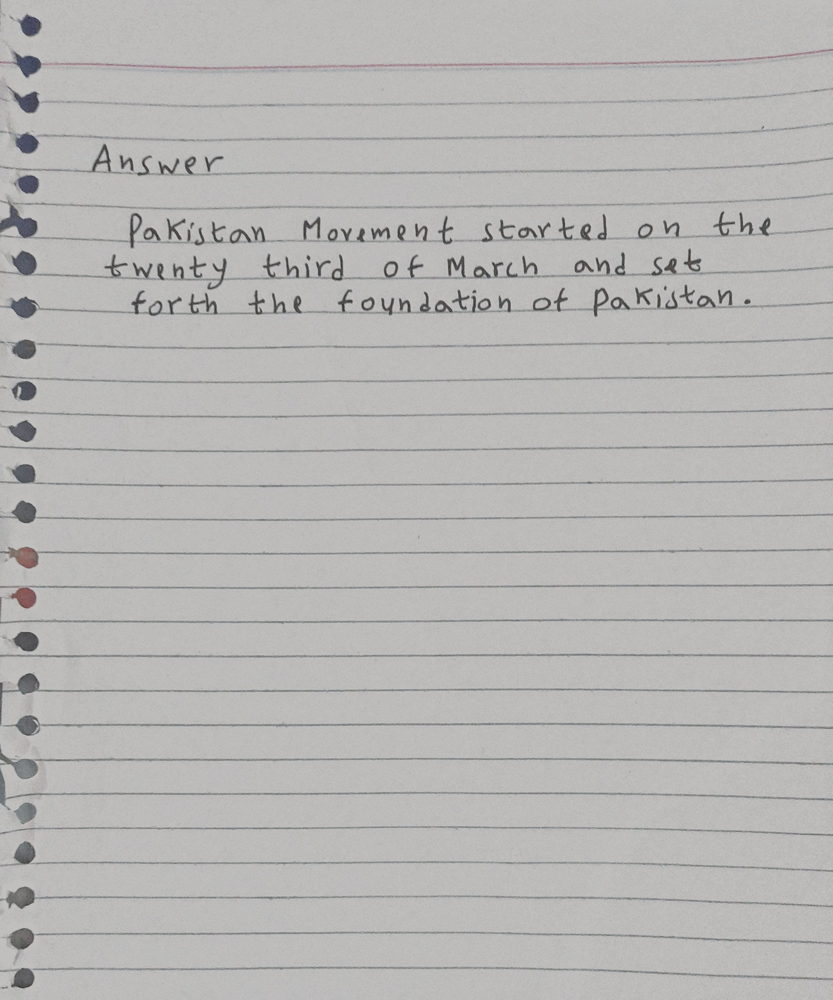

In [30]:
display(image)

In [31]:
img_cropped=[]

for i in range(len(increased_boxes)): #len(result2)-1
  x1, y1, x2, y2, x3, y3, x4, y4 =increased_boxes[i]
  left = min(x1, x2, x3, x4)
  upper = min(y1, y2, y3, y4)
  right = max(x1, x2, x3, x4)
  lower = max(y1, y2, y3, y4)
  cropped_width = right - left
  cropped_height = lower - upper
  if cropped_width >= 20 and cropped_height >= 20:
 
    img_cropped.append(image.crop((left, upper, right,lower)))





In [32]:
from PIL import Image, ImageEnhance, ImageFilter
for i in range (0,len(img_cropped)):
 
  img_cropped[i].save(f'Cropped/Test_Image{i}.jpg')


  

In [33]:
from transformers import VisionEncoderDecoderModel
from transformers import TrOCRProcessor
model = VisionEncoderDecoderModel.from_pretrained("microsoft/trocr-large-handwritten")
processor = TrOCRProcessor.from_pretrained("microsoft/trocr-large-handwritten")

Some weights of VisionEncoderDecoderModel were not initialized from the model checkpoint at microsoft/trocr-large-handwritten and are newly initialized: ['encoder.pooler.dense.bias', 'encoder.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration. Please open a PR/issue to update `preprocessor_config.json` to use `image_processor_type` instead of `feature_extractor_type`. This warning will be removed in v4.40.


In [34]:
import re

def remove_non_alphabet_characters(input_string):
    result_string = re.sub(r'[^a-zA-Z\s]', '', input_string)
    return result_string

In [35]:
def levenshtein_distance(s1, s2):
    """
    Compute Levenshtein distance between two strings.
    """
    if len(s1) < len(s2):
        return levenshtein_distance(s2, s1)

    if len(s2) == 0:
        return len(s1)

    previous_row = range(len(s2) + 1)
    for i, c1 in enumerate(s1):
        current_row = [i + 1]
        for j, c2 in enumerate(s2):
            insertions = previous_row[j + 1] + 1
            deletions = current_row[j] + 1
            substitutions = previous_row[j] + (c1 != c2)
            current_row.append(min(insertions, deletions, substitutions))
        previous_row = current_row

    return previous_row[-1]

def are_similar(s1, s2, threshold):
    """
    Check if two strings are similar based on Levenshtein distance.
    """
    distance = levenshtein_distance(s1, s2)
    similarity = 1 - distance / max(len(s1), len(s2))
    return similarity > threshold

In [36]:
resultant_string =""
from PIL import Image, ImageFilter
strings=[]
for i in range (0,len(img_cropped)):
  image=Image.open(f'Cropped/Test_Image{i}.jpg')


  # calling the processor is equivalent to calling the feature extractor
  pixel_values = processor(image, return_tensors="pt").pixel_values

  generated_ids = model.generate(pixel_values)
  generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
  generated_text=remove_non_alphabet_characters(generated_text)
  generated_text=generated_text.strip()
  
  if (i>0 and are_similar(strings[len(strings)-1],generated_text,0.8)):
    print("check")
    
  else:
    strings.append(generated_text)
    resultant_string+=generated_text
    print(f"{i}:{generated_text}")
  

  resultant_string+=" "
  
  

e:\Study\Environments\testlab\Lib\site-packages\transformers\generation\utils.py:1133: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


0:Answer
1:Pakistan Movement started on the
2:Twenty third of March and set
3:forth the foundation of Pakistan


In [37]:


image=Image.open("result/res_photo.jpg728663880197928511.jpg")
width, height = image.size

print(width)

bounding_boxes=read_bounding_boxes_from_file("result/res_photo.jpg728663880197928511.txt")
print(bounding_boxes)


increased_boxes = []
for box in word_boxes:
    x1, y1, x2, y2, x3, y3, x4, y4 = box
    # Increase width by adding the increase value to x2 and x3 coordinates
    increased_box = (0, y1, width, y2, 0, y3,width, y4)
    increased_boxes.append(increased_box)
print(increased_boxes)

4000


FileNotFoundError: [Errno 2] No such file or directory: 'result/res_photo.jpg728663880197928511.txt'